In [1]:
!pip install transformers

In [2]:
!pip3 install transformers --upgrade

In [3]:
from transformers import ViTForImageClassification, ViTImageProcessor
import cv2
import os
import torch
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from time import sleep
import shutil
from math import sqrt
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import tqdm

In [4]:
!pwd

/Users/vaibhavmudgal/VideoMemThsis


In [5]:
class videoProcessor:
    def __init__(self, defaultDir, inputDirectoryName, extractDirectoryName, frameInterval):#croppedDirectoryName, boxedDirectoryName, frameInterval, cropPercent):
        self.defaultDir = defaultDir
        self.inputDirectoryName = inputDirectoryName
        self.extractDirectoryName = extractDirectoryName
#         self.croppedDirectoryName = croppedDirectoryName
#         self.boxedDirectoryName = boxedDirectoryName
        self.frameInterval = frameInterval
#         self.cropPercent = cropPercent

        self.videoPath = defaultDir + str('/') + inputDirectoryName
        self.fileCount = len(os.listdir(self.videoPath))

      
    def frameResizing(self):
        ### resizing all frames to (640, 480)

        for i in range(1, 1501):

            no_of_frames_inside_file = len(os.listdir(f"{self.defaultDir}/{self.extractDirectoryName}/{i}/"))

            mem_score = [0]*no_of_frames_inside_file

            for j in range(1, no_of_frames_inside_file+1):
                # Read the image
                image_path = f"{self.defaultDir}/{self.extractDirectoryName}/{i}/frame{10*j}.jpg"
                # Open the input image file
                with Image.open(image_path) as img:

                    output_size = (640, 480)

                    # Resize the cropped image to the output size
                    resized_img = img.resize(output_size)

                    # Save the resized image to a file
                    output_file = new_dir = f"{self.defaultDir}/{self.extractDirectoryName}/{i}/frame{10*j}.jpg"
                    resized_img.save(output_file)


    def extractFrames(self):

        #inside else block since frames are extracted only once and it makes no sense extracting frames at each iteration
        for i in range(1, self.fileCount+1):
            
            vid = os.listdir("/Users/vaibhavmudgal/VideoMemThsis/dataset/")
            
            if '.ipynb_checkpoints' in vid:
                vid.remove('.ipynb_checkpoints')
            
            default_output_dir = f"{self.defaultDir}/{self.extractDirectoryName}"
            
            os.mkdir(f"{default_output_dir}/{i}/")

            # Set the output directory where the frames will be saved
            output_dir = f"{default_output_dir}/{i}/"

            # Set the frame extraction interval (extract every n-th frame)
            interval = self.frameInterval

            # Open the video file
            cap = cv2.VideoCapture(f"{self.videoPath}/{vid[i-1]}")

            # Initialize a frame counter
            frame_counter = 0

            # Loop through the video frames
            while True:
              # Read the next frame
              ret, frame = cap.read()

              # If there are no more frames, break the loop
              if not ret:
                    break

              # Increment the frame counter
              frame_counter += 1

              # If the frame counter is divisible by the interval, extract the frame
              if frame_counter % interval == 0:
                  # Construct the output filename
                  output_filename = output_dir + "frame{}.jpg".format(frame_counter)

                  # Save the frame as a JPEG image
                  cv2.imwrite(output_filename, frame)
            cap.release()
  


    def loadModel(self, modelName):
        self.loaded_feature_extractor = ViTImageProcessor.from_pretrained(f"{self.defaultDir}/{modelName}")
        self.loaded_model = ViTForImageClassification.from_pretrained(f"{self.defaultDir}/{modelName}")
  
  
    def memScore(self):
        memScoreDict = {}
        self.extracted_mem_score = [0]*self.fileCount
#         self.cropped_mem_score = [0]*self.fileCount

        extracted_input_dir = f"{self.defaultDir}/{self.extractDirectoryName}"
#         cropped_input_dir = f"{self.defaultDir}/{self.croppedDirectoryName}"

        for i in range(1, self.fileCount+1):
            print(f"... file number {i}")

            no_of_frames_inside_file = len(os.listdir(f"{extracted_input_dir}/{i}/"))

            temp_mem_score_extract = [0]*no_of_frames_inside_file
#             temp_mem_score_cropped = [0]*no_of_frames_inside_file

            for j in range(1, no_of_frames_inside_file + 1):
                #read the image
                extracted_image_path = f"{extracted_input_dir}/{i}/frame{10*j}.jpg"      ##extracted frames
                extracted_image = Image.open(extracted_image_path)

#                 cropped_image_path = f"{cropped_input_dir}/{i}/frame{10*j}.jpg"      ##cropped frames
#                 cropped_image = Image.open(cropped_image_path)

                # Preprocess the image using the feature extractor
                extracted_inputs = self.loaded_feature_extractor(images=extracted_image, return_tensors="pt")   ##extracted frames
#                 cropped_inputs = self.loaded_feature_extractor(images=cropped_image, return_tensors="pt")   ##cropped frames

                # Pass the preprocessed image to the model
                with torch.no_grad():
                    extracted_outputs = self.loaded_model(**extracted_inputs)   ##extracted frames
#                     cropped_outputs = self.loaded_model(**cropped_inputs)       ##cropped frames

                # Get the output logits (in this case, for a regression task)
                temp_mem_score_extract[j-1] = extracted_outputs.logits.item()   ##extracted frames
#                 temp_mem_score_cropped[j-1] = cropped_outputs.logits.item()     ##cropped frames

            self.extracted_mem_score[i-1] = float(sum(temp_mem_score_extract) / no_of_frames_inside_file)     ##extracted frames
#             self.cropped_mem_score[i-1] = float(sum(temp_mem_score_cropped) / no_of_frames_inside_file)       ##cropped frames
            
            memScoreDict[i] = self.extracted_mem_score[i-1]
        
        return self.extracted_mem_score, memScoreDict

In [48]:
new = videoProcessor('/Users/vaibhavmudgal/VideoMemThsis', 'dataset', 'ExtractedFrames', 10)

In [9]:
new.extractFrames()

In [34]:
new.frameResizing()

In [49]:
new.loadModel("model")

In [50]:
memScore, memScoreDict = new.memScore()

... file number 1
... file number 2
... file number 3
... file number 4
... file number 5
... file number 6
... file number 7
... file number 8
... file number 9
... file number 10
... file number 11
... file number 12
... file number 13
... file number 14
... file number 15
... file number 16
... file number 17
... file number 18
... file number 19
... file number 20
... file number 21
... file number 22
... file number 23
... file number 24
... file number 25
... file number 26
... file number 27
... file number 28
... file number 29
... file number 30
... file number 31
... file number 32
... file number 33
... file number 34
... file number 35
... file number 36
... file number 37
... file number 38
... file number 39
... file number 40
... file number 41
... file number 42
... file number 43
... file number 44
... file number 45
... file number 46
... file number 47
... file number 48
... file number 49
... file number 50
... file number 51
... file number 52
... file number 53
..

... file number 417
... file number 418
... file number 419
... file number 420
... file number 421
... file number 422
... file number 423
... file number 424
... file number 425
... file number 426
... file number 427
... file number 428
... file number 429
... file number 430
... file number 431
... file number 432
... file number 433
... file number 434
... file number 435
... file number 436
... file number 437
... file number 438
... file number 439
... file number 440
... file number 441
... file number 442
... file number 443
... file number 444
... file number 445
... file number 446
... file number 447
... file number 448
... file number 449
... file number 450
... file number 451
... file number 452
... file number 453
... file number 454
... file number 455
... file number 456
... file number 457
... file number 458
... file number 459
... file number 460
... file number 461
... file number 462
... file number 463
... file number 464
... file number 465
... file number 466


... file number 827
... file number 828
... file number 829
... file number 830
... file number 831
... file number 832
... file number 833
... file number 834
... file number 835
... file number 836
... file number 837
... file number 838
... file number 839
... file number 840
... file number 841
... file number 842
... file number 843
... file number 844
... file number 845
... file number 846
... file number 847
... file number 848
... file number 849
... file number 850
... file number 851
... file number 852
... file number 853
... file number 854
... file number 855
... file number 856
... file number 857
... file number 858
... file number 859
... file number 860
... file number 861
... file number 862
... file number 863
... file number 864
... file number 865
... file number 866
... file number 867
... file number 868
... file number 869
... file number 870
... file number 871
... file number 872
... file number 873
... file number 874
... file number 875
... file number 876


... file number 1226
... file number 1227
... file number 1228
... file number 1229
... file number 1230
... file number 1231
... file number 1232
... file number 1233
... file number 1234
... file number 1235
... file number 1236
... file number 1237
... file number 1238
... file number 1239
... file number 1240
... file number 1241
... file number 1242
... file number 1243
... file number 1244
... file number 1245
... file number 1246
... file number 1247
... file number 1248
... file number 1249
... file number 1250
... file number 1251
... file number 1252
... file number 1253
... file number 1254
... file number 1255
... file number 1256
... file number 1257
... file number 1258
... file number 1259
... file number 1260
... file number 1261
... file number 1262
... file number 1263
... file number 1264
... file number 1265
... file number 1266
... file number 1267
... file number 1268
... file number 1269
... file number 1270
... file number 1271
... file number 1272
... file numb

In [7]:
memScore.sort()

In [9]:
memScore[-1]

0.9867482847637601

In [15]:
sortedMemScoreDict = dict(sorted(memScoreDict.items(), key = lambda x: x[1]))

In [18]:
increasingVideoScores = sortedMemScoreDict.keys()

In [108]:
sortedMemScoreDict

{694: 0.49774518609046936,
 145: 0.5108338760005103,
 1086: 0.5136924054887559,
 41: 0.5169543789492713,
 1355: 0.5275689628389146,
 236: 0.5284284693854195,
 104: 0.5384413599967957,
 390: 0.5425127016173469,
 1366: 0.5502902501159244,
 566: 0.5527664025624593,
 380: 0.5548932353655497,
 576: 0.5586207906405131,
 25: 0.5604072544309828,
 324: 0.5607810020446777,
 1162: 0.5629466970761617,
 1076: 0.5642641054259406,
 1277: 0.5659062332577176,
 690: 0.5702599287033081,
 44: 0.5813049077987671,
 1361: 0.5820038616657257,
 892: 0.5873805218272738,
 1257: 0.5883411433961656,
 131: 0.5883739524417453,
 488: 0.5894825922118293,
 443: 0.5902154275349208,
 449: 0.5908583071496751,
 59: 0.5908908579084609,
 535: 0.5911298327975802,
 1046: 0.5916037592622969,
 166: 0.5916740761862861,
 937: 0.5941750577517918,
 485: 0.5960111949178908,
 1053: 0.598285049200058,
 1298: 0.6004285679923164,
 1202: 0.6012425223986307,
 446: 0.6023932960298326,
 244: 0.6037365992863973,
 1150: 0.6048057013087802,
 12

In [ ]:
# Step 1: Convert the list to a string representation
observations_str = '\n'.join(str(score) for score in memScore)

# Step 2: Open a file in write mode
file_path = '/Users/vaibhavmudgal/VideoMemThsis/memScoresOriginal.txt'
with open(file_path, 'w') as file:
    # Step 3: Write the string representation of the list to the file
    file.write(observations_str)

# Step 4: File is automatically closed after the 'with' block
print(f"Observations saved to '{file_path}'.")

In [ ]:
df = pd.DataFrame

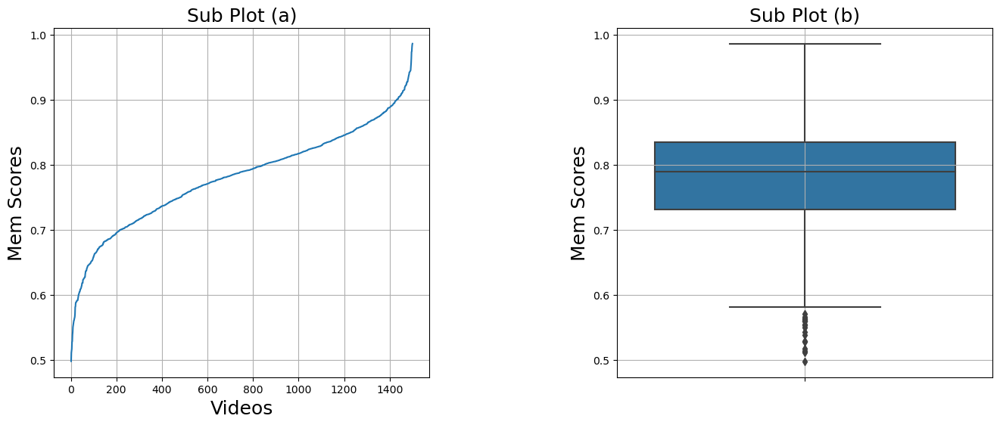

In [101]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6), gridspec_kw={'wspace': 0.5})
# Create the box plot using Seaborn
sns.lineplot(x = [i for i in range(1, len(memScore) + 1)], y=memScore, ax=axes[0])

# Create the box plot using Seaborn
sns.boxplot(y=memScore, ax=axes[1])

# Set the plot labels and title

axes[0].set_title('Sub Plot (a)', fontsize = 18)
axes[0].set_xlabel('Videos', fontsize = 18)
axes[0].set_ylabel('Mem Scores', fontsize = 18)
axes[0].grid(True)

axes[1].set_title('Sub Plot (b)', fontsize = 18)
# axes[1].set_xlabel('Videos')
axes[1].set_ylabel('Mem Scores', fontsize = 18)
axes[1].grid(True)


# Show the plot
plt.show()


# Lowest and Highest Score Frames

In [45]:
def memScoreFrames(i):
        defaultDir = '/Users/vaibhavmudgal/VideoMemThsis/ExtractedFrames'
        modelDir = '/Users/vaibhavmudgal/VideoMemThsis/model'
        loaded_feature_extractor = ViTImageProcessor.from_pretrained(f"{modelDir}")
        loaded_model = ViTForImageClassification.from_pretrained(f"{modelDir}")

        extracted_input_dir = f'{defaultDir}/{i}'
        
        filecount = len(os.listdir(extracted_input_dir))
        print(filecount)
        mem_score_extract = [0]*filecount
        
        
        for j in range(1, filecount+1):

            #read the image
            extracted_image_path = f"{extracted_input_dir}/frame{10*j}.jpg"      ##extracted frames
            extracted_image = Image.open(extracted_image_path)

            # Preprocess the image using the feature extractor
            extracted_inputs = loaded_feature_extractor(images=extracted_image, return_tensors="pt")   ##extracted frames

            # Pass the preprocessed image to the model
            with torch.no_grad():
                extracted_outputs = loaded_model(**extracted_inputs)   ##extracted frames

            # Get the output logits (in this case, for a regression task)
            mem_score_extract[j-1] = extracted_outputs.logits.item()   ##extracted frames
        
        avgScore = float(sum(mem_score_extract) / filecount)

        
        return mem_score_extract, avgScore

In [46]:
memScoreFrames(694)

9


([0.504531979560852,
  0.4760197699069977,
  0.4797583222389221,
  0.4876251816749573,
  0.48937857151031494,
  0.5301963090896606,
  0.48044902086257935,
  0.5430309176445007,
  0.48871660232543945],
 0.49774518609046936)

In [47]:
memScoreFrames(82)

9


([0.6347150802612305,
  0.5748859643936157,
  0.6188679337501526,
  0.6112485527992249,
  0.6316918134689331,
  0.6572216749191284,
  0.6883562207221985,
  0.6661765575408936,
  0.6659712195396423],
 0.6387927797105577)

In [48]:
memScoreFrames(201)

9


([1.0053472518920898,
  0.9980920553207397,
  0.9973492622375488,
  0.9961963891983032,
  0.9985781311988831,
  0.9565863609313965,
  0.9750509262084961,
  0.9836487174034119,
  0.9698854684829712],
 0.9867482847637601)

In [49]:
memScoreFrames(126)

9


([0.9528902769088745,
  0.9444727897644043,
  0.9392088055610657,
  0.9069898128509521,
  0.9458624124526978,
  0.9378602504730225,
  0.9008785486221313,
  0.8933236598968506,
  0.9230061173439026],
 0.9271658526526557)

In [98]:
memScoreFrames(349)

7


([0.8111168742179871,
  0.8246034383773804,
  0.7685578465461731,
  0.8498163223266602,
  0.8306005001068115,
  0.8387006521224976,
  0.8315495252609253],
 0.8221350227083478)

In [16]:
import pandas as pd
import numpy as np

In [22]:
df = pd.read_csv('/Users/vaibhavmudgal/VideoMemThsis/memScoresOriginal.txt', header = None)
scores = df[0].values

In [37]:
# Set the seed for reproducibility (optional)
np.random.seed(42)

# Generate 1500 random numbers from a normal distribution between 0 and 1
mean = 0.75  # Set the mean of the normal distribution
std_dev = 0.125  # Set the standard deviation of the normal distribution
size = 1500  # Number of random numbers to generate

# Generate the random numbers
random_numbers = np.random.normal(loc=mean, scale=std_dev, size=size)

# Clip the numbers to ensure they stay within the range [0, 1]
random_numbers = np.clip(random_numbers, 0.5, 1)

# Print the first 10 random numbers as a sample
print(random_numbers[:10])

[0.81208927 0.73271696 0.83096107 0.94037873 0.72073083 0.72073288
 0.9474016  0.84592934 0.6913157  0.81782001]


In [38]:
random_numbers.sort()

In [40]:
observations_str = '\n'.join(str(score) for score in random_numbers)
file_path = '/Users/vaibhavmudgal/VideoMemThsis/randomNumbers.txt' 
with open(file_path, 'w') as file:
    file.write(observations_str)

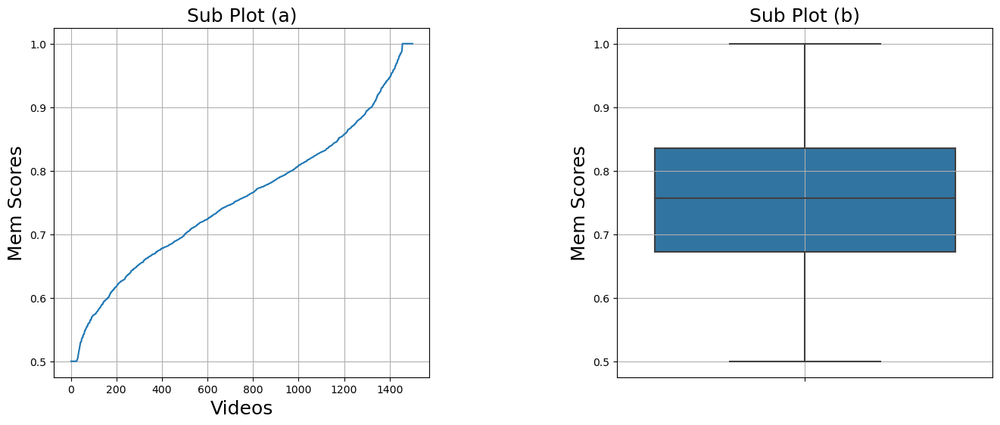

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6), gridspec_kw={'wspace': 0.5})
# Create the box plot using Seaborn
sns.lineplot(x = [i for i in range(1, len(random_numbers) + 1)], y=random_numbers, ax=axes[0])

# Create the box plot using Seaborn
sns.boxplot(y=random_numbers, ax=axes[1])

# Set the plot labels and title

axes[0].set_title('Sub Plot (a)', fontsize = 18)
axes[0].set_xlabel('Videos', fontsize = 18)
axes[0].set_ylabel('Mem Scores', fontsize = 18)
axes[0].grid(True)

axes[1].set_title('Sub Plot (b)', fontsize = 18)
# axes[1].set_xlabel('Videos')
axes[1].set_ylabel('Mem Scores', fontsize = 18)
axes[1].grid(True)


# Show the plot
plt.show()


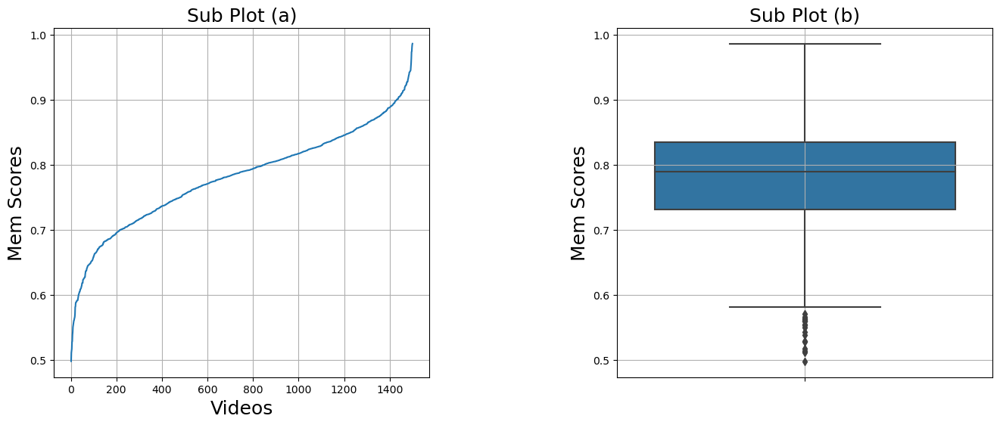

In [23]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6), gridspec_kw={'wspace': 0.5})
# Create the box plot using Seaborn
sns.lineplot(x = [i for i in range(1, len(scores) + 1)], y=scores, ax=axes[0])

# Create the box plot using Seaborn
sns.boxplot(y=scores, ax=axes[1])

# Set the plot labels and title

axes[0].set_title('Sub Plot (a)', fontsize = 18)
axes[0].set_xlabel('Videos', fontsize = 18)
axes[0].set_ylabel('Mem Scores', fontsize = 18)
axes[0].grid(True)

axes[1].set_title('Sub Plot (b)', fontsize = 18)
# axes[1].set_xlabel('Videos')
axes[1].set_ylabel('Mem Scores', fontsize = 18)
axes[1].grid(True)


# Show the plot
plt.show()


In [1]:
import json

In [4]:
# Step 1: Read the JSON file
file_path = "/Users/vaibhavmudgal/VideoMemThsis/memento_dev_data.json"
with open(file_path, "r") as json_file:
    data = json.load(json_file)



In [11]:
scores = [0]*1500

for i in range(1500):
    scores[i] = data[i]['mem_score']

In [13]:
scores.sort()

In [19]:
scores[-1]

1.0

In [17]:
df = pd.read_csv('/Users/vaibhavmudgal/VideoMemThsis/memScoresOriginal.txt', header = None)
scores_new = df[0].values

In [18]:
scores_new

array([0.49774519, 0.51083388, 0.51369241, ..., 0.98118005, 0.98512638,
       0.98674828])

Text(0, 0.5, 'Mem Scores')

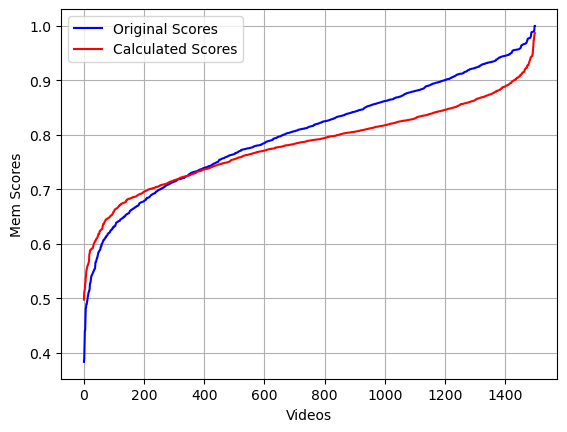

In [28]:
sns.lineplot(scores, color = 'blue', label = 'Original Scores')
sns.lineplot(scores_new, color = 'red', label = 'Calculated Scores')
plt.grid(True)
plt.xlabel('Videos')
plt.ylabel('Mem Scores')

In [8]:
!ls /Users/vaibhavmudgal/Thesis_ppt_photos/

1.jpg 2.jpg 3.jpg 4.jpg 5.jpg 6.jpg


In [26]:
loaded_feature_extractor = ViTImageProcessor.from_pretrained(f"/Users/vaibhavmudgal/VideoMemThsis/model")
loaded_model = ViTForImageClassification.from_pretrained(f"/Users/vaibhavmudgal/VideoMemThsis/model")

temp_mem_score_extract = 0

#read the image
extracted_image_path = "/Users/vaibhavmudgal/Thesis_ppt_photos/1.jpg"      ##extracted frames
extracted_image = Image.open(extracted_image_path)


# Preprocess the image using the feature extractor
extracted_inputs = loaded_feature_extractor(images=extracted_image, return_tensors="pt")   ##extracted frames

# Pass the preprocessed image to the model
with torch.no_grad():
    extracted_outputs = loaded_model(**extracted_inputs)   ##extracted frames

# Get the output logits (in this case, for a regression task)
temp_mem_score_extract = extracted_outputs.logits.item()   ##extracted frames

print(temp_mem_score_extract)

UnidentifiedImageError: cannot identify image file '/Users/vaibhavmudgal/Thesis_ppt_photos/1.jpg'

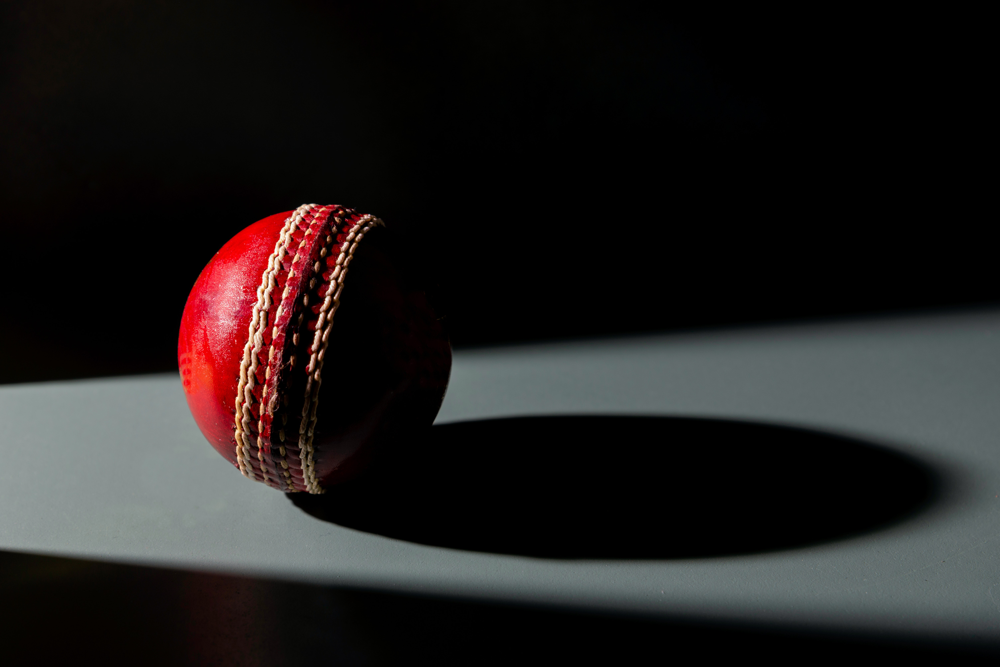

In [27]:
extracted_image